# Topic Modelling Using Data From Forums

Install Packages


In [22]:
!pip install python-docx


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.3/244.3 kB 3.9 MB/s eta 0:00:00


In [24]:
!pip install pyLDAvis


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 26.4 MB/s eta 0:00:00


In [2]:
!pip install datasets


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 527.3/527.3 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.9/39.9 MB 57.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 17.5 MB/s eta 0:00:00
  Attempting uninstall: pyarrow
    Found existing installation: pyarrow 14.0.2
    Uninstalling pyarrow-14.0.2:
      Successfully uninstalled pyarrow-14.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 24.4.1 requires pyarrow<15.0.0a0,>=14.0.1, but you have pyarrow 17.0.0 which is incompatible.
ibis-framework 8.0.0 requires pyarrow<16,>=2, but you have pyarrow 17.0.0 which is incompatible.


Upload and Pre-process Data

In [3]:
from google.colab import files
uploaded = files.upload()

for filename in uploaded.keys():
    print(f'uploaded file "{filename}" with {uploaded[filename]} bytes')


Saving fiat forum data.csv to fiat forum data.csv
uploaded file "fiat forum data.csv" with b'Title,Content,Comment,Comment Time,,,,,,,\r\nNew Fiat 500! Confused from UK!,I have just leased a new Fiat 500 hybrid. The manual is pants! Going to need help - TIA,I have just leased a new Fiat 500 hybrid. The manual is pants! Going to need help - TIA,2024-04-26T16:24:05+0100,,,,,,,\r\nNew Fiat 500! Confused from UK!,I have just leased a new Fiat 500 hybrid. The manual is pants! Going to need help - TIA,what sort of help?,2024-04-26T16:24:05+0100,,,,,,,\r\nNew Fiat 500! Confused from UK!,I have just leased a new Fiat 500 hybrid. The manual is pants! Going to need help - TIA,"The manual is pants and there are a few symbols/switches I can\xe2\x80\x99t fathom. Will take photos and post tomorrow \nhopefully for help.",2024-04-26T20:30:19+0100,,,,,,,\r\nNew Fiat 500! Confused from UK!,I have just leased a new Fiat 500 hybrid. The manual is pants! Going to need help - TIA,"Sparkly said:\n\n\n\nThe m

In [4]:
import pandas as pd


file_path = 'fiat forum data.csv'  
try:
    df = pd.read_csv(file_path, encoding='utf-8')
except UnicodeDecodeError:
    print("utf-8 wrong，trying latin1 ")
    df = pd.read_csv(file_path, encoding='latin1')


if df.empty:
    print("failed")
else:
    comments = df['Comment']  
    print("success")




utf-8 wrong，trying latin1 
success


This code snippet creates a list of keywords related to a car model and its features. It then converts this list into a DataFrame using pandas. Finally, the DataFrame is saved as a CSV file named final_filtered_keywords.csv, without including the index column.

In [5]:

final_keywords = [
    "Fiat 500 Dolcevita", "Fiat 500C Dolcevita", "500 Dolcevita", "500C Dolcevita", "Dolcevita edition",
    "Hybrid City Car", "Mild Hybrid", "1.0 Mild Hybrid", "7-inch touchscreen", "Apple CarPlay", "Android Auto",
    "Convertible roof", "Panoramic sunroof", "Retro design", "Dualogic Transmission", "Limited edition",
    "White interior", "Vertical piped seats", "1.2-litre engine", "4.8L/100km fuel economy", "111g/km emissions",
    "Manual transmission", "Robotised manual transmission", "Cruise control", "Uconnect radio", "LED Daytime Running Lights",
    "Iconic style", "Luxury trim", "Special paint", "Techno Blue dashboard", "Eco-leather steering wheel",
    "16\" alloy wheels", "Dedicated interiors", "Sporty seats", "Blue fabric seats with Fiat monogram",
    "Fuel-efficient", "City car", "Compact design", "Premium materials", "Ambient lighting", "Heated seats",
    "Advanced safety features", "Driver assistance systems", "Navigation system", "Bluetooth connectivity",
    "Wireless charging", "Special edition", "Unique color options", "Customizable options"
]

# Convert the list of keywords into a DataFrame
final_keywords_df = pd.DataFrame(final_keywords, columns=['Keyword'])

# Save the DataFrame to a CSV file
final_keywords_df.to_csv('final_filtered_keywords.csv', index=False)




In [6]:

keywords_df = pd.read_csv('final_filtered_keywords.csv', encoding='ISO-8859-1')
comments_df = pd.read_csv('fiat forum data.csv', encoding='ISO-8859-1')


comments_df = comments_df.dropna(subset=['Comment'])

print(f"Loaded {len(keywords_df)} keywords and {len(comments_df)} comments.")



Loaded 49 keywords and 14104 comments.


This code processes a set of comments and filters them based on their relevance to a list of predefined keywords. It first combines the keywords into a single string and then creates a corpus with this string and the comments. The corpus is vectorized using TF-IDF, and cosine similarity is calculated between the keyword vector and each comment vector. Comments that exceed a specified similarity threshold are considered relevant and are saved to a new CSV file named filtered_comments.csv.

In [7]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

# Extract comments and keywords
comments = comments_df['Comment'].tolist()
keywords = keywords_df['Keyword'].tolist()

# Combine keywords into a single string
keywords_str = ' '.join(keywords)

# Create a corpus with the keyword string and comments
corpus = [keywords_str] + comments

# Vectorize the corpus using TF-IDF
vectorizer = TfidfVectorizer(stop_words='english')
X = vectorizer.fit_transform(corpus)

# Calculate cosine similarity between the keyword vector and all comments
similarity_scores = cosine_similarity(X[0:1], X[1:]).flatten()

# Set relevance threshold
threshold = 0.05

# Filter comments based on the threshold
relevant_comments_indices = [i for i, score in enumerate(similarity_scores) if score > threshold]
filtered_comments = [comments[i] for i in relevant_comments_indices]

# Save filtered comments to a new CSV file
filtered_comments_df = pd.DataFrame(filtered_comments, columns=['Comment'])
filtered_comments_df.to_csv('filtered_comments.csv', index=False)

print(f"Filtered comments saved to 'filtered_comments.csv'.")





Filtered comments saved to 'filtered_comments.csv'.


In [9]:
import pandas as pd

# Attempt to read the file with utf-8 encoding
file_path = 'filtered_comments.csv'  # Update with your actual file path
try:
    df = pd.read_csv(file_path, encoding='utf-8')
except UnicodeDecodeError:
    print("utf-8 wrong，trying latin1 ")
    df = pd.read_csv(file_path, encoding='latin1')

# Check if the file was read successfully
if df.empty:
    print("failed")
else:
    comments = df['Comment']  # Assuming the column containing comments is named 'Comment'
    print("success")


success


This code performs text preprocessing on a column of comments in a DataFrame. It uses the spacy and nltk libraries to clean and tokenize the text, removing stop words and non-alphabetic characters, and lemmatizing the words. The processed text is then stored in a new column.

In [10]:
import re
import spacy
import nltk
from nltk.corpus import stopwords
from gensim.models import Phrases
from gensim.corpora import Dictionary

nltk.download('stopwords')

# Load spacy model
nlp = spacy.load('en_core_web_sm')
stop_words = set(stopwords.words('english'))

# Preprocessing function
def preprocess(text):
    text = str(text)  # Ensure input is string type
    text = re.sub(r'\s+', ' ', text)  # Remove extra spaces
    text = re.sub(r'\d', '', text)  # Remove digits
    doc = nlp(text.lower())  # Convert to lowercase and process with spacy
    tokens = [token.lemma_ for token in doc if token.text not in stop_words and token.is_alpha]
    return tokens

# Ensure 'Comment' column has no NaN values and convert to string type
df['Comment'] = df['Comment'].fillna('').astype(str)

# Apply preprocessing function
df['processed'] = df['Comment'].apply(preprocess)




[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


This code constructs bigram and trigram models from the preprocessed text data in the DataFrame. The models are then applied to the data to generate bigrams and trigrams, which are stored in a new column.

In [11]:
# Build bigram and trigram models
bigram = Phrases(df['processed'], min_count=5, threshold=100)
trigram = Phrases(bigram[df['processed']], threshold=100)

# Apply the models to the data
df['trigram'] = df['processed'].apply(lambda x: trigram[bigram[x]])



In [12]:

dictionary = Dictionary(df['trigram'])
corpus = [dictionary.doc2bow(text) for text in df['trigram']]


This code calculates coherence scores for different numbers of topics in an LDA model to determine the optimal number of topics for the dataset. It then plots these coherence scores to help visualize how the number of topics affects the coherence.

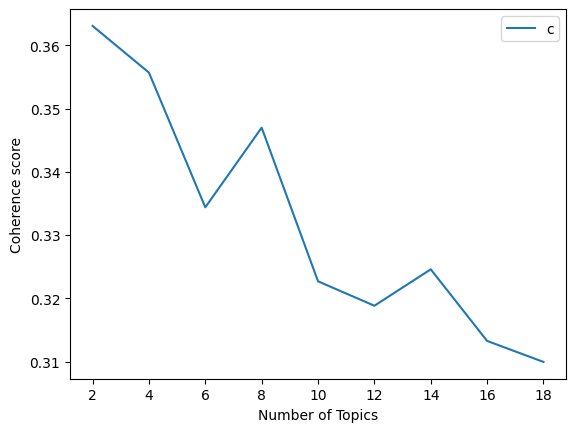

In [13]:
from gensim.models import CoherenceModel
from gensim.models.ldamodel import LdaModel

def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())
    return model_list, coherence_values

model_list, coherence_values = compute_coherence_values(dictionary=dictionary, corpus=corpus, texts=df['trigram'], start=2, limit=20, step=2)

# Plot coherence scores
import matplotlib.pyplot as plt

x = range(2, 20, 2)
plt.plot(x, coherence_values)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence score")
plt.legend("coherence_values", loc='best')
plt.show()



This code determines the optimal number of topics for the LDA model by selecting the number of topics that yields the highest coherence score. It then creates an LDA model using this optimal number of topics.

In [14]:
optimal_num_topics = x[coherence_values.index(max(coherence_values))]
lda_model = LdaModel(corpus=corpus, id2word=dictionary, num_topics=optimal_num_topics)


In [15]:
topics = lda_model.print_topics(num_words=200)
for topic in topics:
    print(topic)


(0, '0.017*"car" + 0.015*"fiat" + 0.011*"say" + 0.010*"get" + 0.009*"new" + 0.007*"would" + 0.007*"like" + 0.007*"engine" + 0.006*"click_expand" + 0.006*"go" + 0.006*"seat" + 0.005*"one" + 0.005*"panda" + 0.005*"well" + 0.005*"good" + 0.005*"look" + 0.005*"model" + 0.005*"see" + 0.004*"make" + 0.004*"uk" + 0.004*"wheel" + 0.004*"buy" + 0.004*"even" + 0.004*"think" + 0.004*"drive" + 0.004*"year" + 0.003*"time" + 0.003*"much" + 0.003*"also" + 0.003*"come" + 0.003*"use" + 0.003*"really" + 0.003*"back" + 0.003*"sport" + 0.003*"find" + 0.003*"price" + 0.003*"give" + 0.003*"colour" + 0.003*"seem" + 0.003*"could" + 0.003*"black" + 0.003*"take" + 0.003*"lounge" + 0.002*"still" + 0.002*"option" + 0.002*"long" + 0.002*"trim" + 0.002*"standard" + 0.002*"manual" + 0.002*"abarth" + 0.002*"sure" + 0.002*"though" + 0.002*"high" + 0.002*"red" + 0.002*"leather" + 0.002*"change" + 0.002*"first" + 0.002*"dealer" + 0.002*"available" + 0.002*"interior" + 0.002*"transmission" + 0.002*"design" + 0.002*"thing

This code processes a dataset of comments, removing stop words and unrelated terms, and then constructs bigram and trigram models. It uses these models to generate trigrams and filter the comments. An LDA model is then applied to discover the optimal number of topics by evaluating coherence scores. Finally, the topics and their top words are saved to a CSV file.


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


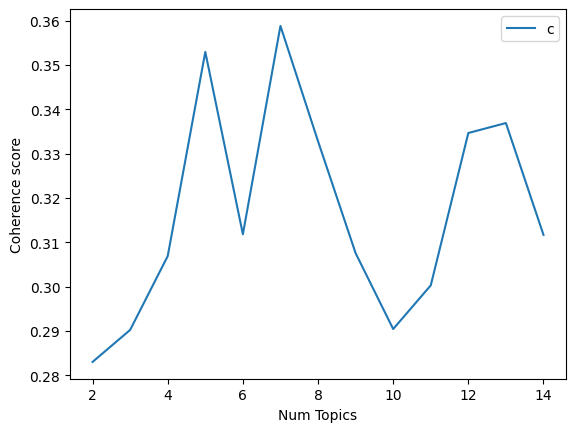

Optimal number of topics: 7
(0, '0.013*"engine" + 0.010*"new" + 0.007*"back" + 0.005*"manual" + 0.004*"rather" + 0.004*"FIRE" + 0.004*"transmission" + 0.004*"auto" + 0.004*"litre" + 0.003*"may"')
(1, '0.012*"seats" + 0.012*"leather" + 0.006*"black" + 0.005*"Abarth" + 0.005*"look" + 0.004*"RED" + 0.004*"red" + 0.004*"see" + 0.004*"better" + 0.004*"My"')
(2, '0.015*"engine" + 0.008*"new" + 0.006*"oil" + 0.006*"model" + 0.005*"transmission" + 0.005*"power" + 0.005*"TwinAir" + 0.005*"aka" + 0.004*"road" + 0.004*"issue"')
(3, '0.012*"new" + 0.007*"Lounge" + 0.006*"standard" + 0.006*"seats" + 0.006*"rear" + 0.006*"also" + 0.006*"available" + 0.005*"engine" + 0.005*"wheels" + 0.004*"New"')
(4, '0.009*"Panda" + 0.008*"years" + 0.007*"cars" + 0.005*"go" + 0.004*"But" + 0.004*"looking" + 0.004*"also" + 0.004*"long" + 0.004*"see" + 0.004*"seats"')
(5, '0.009*"seats" + 0.008*"fuel" + 0.008*"version" + 0.006*"Pop" + 0.005*"electric" + 0.005*"could" + 0.005*"new" + 0.005*"white" + 0.004*"Lounge" + 0

In [16]:
import pandas as pd
import gensim
from gensim.models import Phrases
from gensim.models.phrases import Phraser
from gensim import corpora
from gensim.models.ldamodel import LdaModel
from gensim.models import CoherenceModel
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import matplotlib.pyplot as plt

# Download stopwords and tokenizer models
nltk.download('stopwords')
nltk.download('punkt')

# Load dataset
file_path = 'filtered_comments.csv'  # Update with the actual file path
df = pd.read_csv(file_path, encoding='ISO-8859-1')  # Handle encoding issues

# Preprocessing: Tokenize and remove stopwords
stop_words = set(stopwords.words('english'))
df['tokens'] = df['Comment'].apply(lambda x: [word for word in word_tokenize(str(x)) if word.isalpha() and word not in stop_words])

# Build bigram and trigram models
bigram = Phrases(df['tokens'], min_count=5, threshold=100)  # Higher threshold means fewer phrases.
trigram = Phrases(bigram[df['tokens']], threshold=100)

bigram_mod = Phraser(bigram)
trigram_mod = Phraser(trigram)

# Create trigrams
df['trigrams'] = df['tokens'].apply(lambda x: trigram_mod[bigram_mod[x]])

# Remove words unrelated to Fiat 500 Dolce Vita
unrelated_words = set([
    "I", "said", "The", "would", "like", "UK", "car", "Click_expand", "say", "get", "well", "think", "make", "good", "option", "even", "buy", "use", "much", "though", "seem", "find",
    "take", "time", "come", "give", "bit", "thing", "really", "people", "know", "want", "sure", "nice", "old",
    "different", "little", "day", "lot", "first", "many", "need", "try", "quite", "small", "thank", "problem",
    "last", "give", "bit", "really", "people", "know", "want", "sure", "nice", "different", "l", "little", "order",
    "driver", "day", "lot", "first", "system", "many", "need", "try", "quite", "small", "thank", "problem", "last",
    "sale", "side", "check", "change", "never", "love", "include", "start", "two", "way", "part", "mean",
    "show", "can", "probably", "extra", "etc", "far", "today", "spec", "configurator", "anyone",
    "next", "tell", "original", "ivory", "without", "turn", "value", "ever", "end", "less", "keep", "difference",
    "help", "radio", "every", "test", "either", "happy", "might", "experience", "put", "inside", "week", "retro",
    "yes", "hope", "europe", "worth", "control", "technology", "plus", "pay", "forum", "wonder", "guess",
    "right", "month", "similar", "actually", "not", "base", "however", "post", "Fiat", "It", "FIAT", "one", "still", "got"
])

df['filtered_trigrams'] = df['trigrams'].apply(lambda x: [word for word in x if word not in unrelated_words])

# Create dictionary and corpus
id2word = corpora.Dictionary(df['filtered_trigrams'])
corpus = [id2word.doc2bow(text) for text in df['filtered_trigrams']]

# Test coherence for various topic numbers
coherence_values = []
model_list = []
topic_range = range(2, 15, 1)
random_seed = 7  # Set random seed

for num_topics in topic_range:
    model = LdaModel(corpus=corpus, id2word=id2word, num_topics=num_topics, random_state=random_seed, passes=10)
    model_list.append(model)
    coherencemodel = CoherenceModel(model=model, texts=df['filtered_trigrams'], dictionary=id2word, coherence='c_v')
    coherence_values.append(coherencemodel.get_coherence())

# Plot coherence scores
plt.plot(topic_range, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

# Select the model with the highest coherence score
optimal_num_topics = topic_range[coherence_values.index(max(coherence_values))]
print(f"Optimal number of topics: {optimal_num_topics}")

# Build LDA model with the optimal number of topics
optimal_model = LdaModel(corpus=corpus, id2word=id2word, num_topics=optimal_num_topics, random_state=random_seed, passes=10)

# Print and save the top words for each topic
topics = optimal_model.print_topics(num_words=10)
topic_words_df = pd.DataFrame(topics, columns=["Topic", "Top Words"])
output_path = 'forum_topics_top_50_words.csv'  # Update with the actual save path
topic_words_df.to_csv(output_path, index=False)

for topic in topics:
    print(topic)



This code extracts the document-topic distributions from an already built LDA model and converts them into a DataFrame. It then saves this distribution to a CSV file. Additionally, it defines a function to filter and save comments that are strongly associated with specific topics, based on a specified threshold.

In [17]:
import pandas as pd

# Assume you have already built the optimal LDA model `optimal_model` and generated the corpus

# Extract the document-topic distribution for each comment
doc_topic_dist = optimal_model[corpus]

# Convert the document-topic distribution to a DataFrame
doc_topic_df = pd.DataFrame()

for i, row_list in enumerate(doc_topic_dist):
    row = [0] * optimal_num_topics
    for topic_num, prop in row_list:
        row[topic_num] = prop
    doc_topic_df = pd.concat([doc_topic_df, pd.Series(row)], axis=1)

doc_topic_df = doc_topic_df.T  # Transpose to make topics columns
doc_topic_df.columns = [f"Topic_{i+1}" for i in range(optimal_num_topics)]  # Rename columns

# Save the document-topic distribution to a CSV file
doc_topic_dist_file = 'doc_topic_dist_forum_comments.csv'
doc_topic_df.to_csv(doc_topic_dist_file, index=False)

# Function to extract comments and their weights for each topic
def extract_comments_for_topics(doc_topic_df, comments, num_topics, output_prefix, threshold=0.3):
    for topic in range(num_topics):
        # Extract comments and their weights (probability) for the topic
        topic_comments_weights = [(comments[i], doc_topic_df.iloc[i, topic]) for i in range(len(comments)) if doc_topic_df.iloc[i, topic] > threshold]

        # Save the comments and their weights to a CSV file
        output_file = f"{output_prefix}_topic_{topic + 1}_comments.csv"
        pd.DataFrame(topic_comments_weights, columns=["Comment", "Weight"]).to_csv(output_file, index=False)
        print(f"Comments and weights for Topic {topic + 1} saved to {output_file}")

# Extract comments for identified topics
comments = df['Comment'].tolist()  # Use the original comments

extract_comments_for_topics(doc_topic_df, comments, optimal_num_topics, 'forum_comments')



Topic 1 的评论和权重已保存至 forum_comments_topic_1_comments.csv
Topic 2 的评论和权重已保存至 forum_comments_topic_2_comments.csv
Topic 3 的评论和权重已保存至 forum_comments_topic_3_comments.csv
Topic 4 的评论和权重已保存至 forum_comments_topic_4_comments.csv
Topic 5 的评论和权重已保存至 forum_comments_topic_5_comments.csv
Topic 6 的评论和权重已保存至 forum_comments_topic_6_comments.csv
Topic 7 的评论和权重已保存至 forum_comments_topic_7_comments.csv


This code reads comments associated with different topics from CSV files, calculates the mean and standard deviation of the weights for each topic, and categorizes the comments into "most important," "important," and "least important" based on these statistics. It then saves these categorized comments to separate CSV files for each topic.

In [18]:
import pandas as pd

# Define the directory path where your files are stored
directory_path = "/content"

# List of topics (assuming you have files for each topic)
topics = [1, 2, 3, 4, 5, 6, 7]

for topic_num in topics:
    # Load the comments for the current topic
    topic_df = pd.read_csv(f'{directory_path}/forum_comments_topic_{topic_num}_comments.csv')

    # Calculate the mean and standard deviation for the weights
    mean_weight = topic_df['Weight'].mean()
    std_dev = topic_df['Weight'].std()

    # Define thresholds based on mean and standard deviation
    most_important_threshold = mean_weight + std_dev
    least_important_threshold = mean_weight - std_dev

    # Categorize the comments based on the thresholds
    most_important_comments = topic_df[topic_df['Weight'] > most_important_threshold]
    important_comments = topic_df[(topic_df['Weight'] <= most_important_threshold) & (topic_df['Weight'] >= least_important_threshold)]
    least_important_comments = topic_df[topic_df['Weight'] < least_important_threshold]

    # Save the categorized comments to CSV files
    most_important_comments.to_csv(f'{directory_path}/most_important_comments_topic_{topic_num}.csv', index=False)
    important_comments.to_csv(f'{directory_path}/important_comments_topic_{topic_num}.csv', index=False)
    least_important_comments.to_csv(f'{directory_path}/least_important_comments_topic_{topic_num}.csv', index=False)

    print(f"Categorized comments for Topic {topic_num} have been saved.")


Categorized comments for Topic 1 have been saved.
Categorized comments for Topic 2 have been saved.
Categorized comments for Topic 3 have been saved.
Categorized comments for Topic 4 have been saved.
Categorized comments for Topic 5 have been saved.
Categorized comments for Topic 6 have been saved.
Categorized comments for Topic 7 have been saved.


In [19]:

from google.colab import files

uploaded = files.upload()


import os

for filename in uploaded.keys():
    file_path = os.path.join("/content", filename)
    print(f"File uploaded to: {file_path}")


Saving NEW Cleaned_Few_Shot_Example.csv to NEW Cleaned_Few_Shot_Example.csv
File uploaded to: /content/NEW Cleaned_Few_Shot_Example.csv


This code fine-tunes a pre-trained BART model for text summarization using a few-shot dataset. It checks for GPU availability, loads the tokenizer and model from Hugging Face, and preprocesses the data. The model is then fine-tuned using the specified training arguments, and the resulting model and tokenizer are saved.

In [20]:
import pandas as pd
from datasets import Dataset
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM, Seq2SeqTrainingArguments, Seq2SeqTrainer
import torch

# Check if GPU is available, otherwise use CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Set up Hugging Face model and tokenizer
model_name = "suriya7/bart-finetuned-text-summarization"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSeq2SeqLM.from_pretrained(model_name).to(device)

# Ensure special tokens are set
model.config.decoder_start_token_id = model.config.decoder_start_token_id or tokenizer.bos_token_id
model.config.pad_token_id = model.config.pad_token_id or tokenizer.pad_token_id

from google.colab import files
uploaded = files.upload()
# Load the uploaded CSV file
few_shot_df = pd.read_csv("NEW Cleaned_Few_Shot_Example.csv")

# Preprocess the dataset
def preprocess_function(examples):
    inputs = tokenizer(examples["Comments"], max_length=1024, truncation=True, padding="max_length")
    targets = tokenizer(examples["Summary"], max_length=150, truncation=True, padding="max_length")
    inputs["labels"] = targets["input_ids"]
    inputs["labels"] = [[label if label != tokenizer.pad_token_id else -100 for label in labels] for labels in inputs["labels"]]  # Ignore padding tokens in loss calculation
    return inputs

# Convert DataFrame to Dataset
few_shot_dataset = Dataset.from_pandas(few_shot_df)
tokenized_few_shot_dataset = few_shot_dataset.map(preprocess_function, batched=True)

# Set training arguments
training_args = Seq2SeqTrainingArguments(
    output_dir="./results",
    evaluation_strategy="no",  # Disable evaluation
    learning_rate=6e-5,
    per_device_train_batch_size=4,
    per_device_eval_batch_size=4,
    weight_decay=0.01,
    save_total_limit=3,
    num_train_epochs=45,  # Increase epochs for small dataset
    predict_with_generate=True
)

# Initialize Trainer
trainer = Seq2SeqTrainer(
    model=model,
    args=training_args,
    train_dataset=tokenized_few_shot_dataset,
    tokenizer=tokenizer
)

# Fine-tune the model
trainer.train()

# Save the fine-tuned model and tokenizer
trainer.save_model("./fine-tuned-model")
tokenizer.save_pretrained("./fine-tuned-model")



Using device: cuda


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/1.21k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/798k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.11M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/279 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.66k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.63G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/358 [00:00<?, ?B/s]

Map:   0%|          | 0/15 [00:00<?, ? examples/s]

/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1494: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Step,Training Loss


Some non-default generation parameters are set in the model config. These should go into a GenerationConfig file (https://huggingface.co/docs/transformers/generation_strategies#save-a-custom-decoding-strategy-with-your-model) instead. This warning will be raised to an exception in v4.41.
Non-default generation parameters: {'max_length': 142, 'min_length': 56, 'early_stopping': True, 'num_beams': 4, 'length_penalty': 2.0, 'no_repeat_ngram_size': 3, 'forced_bos_token_id': 0, 'forced_eos_token_id': 2}
Some non-default generation parameters are set in the model config. These should go into a GenerationConfig file (https://huggingface.co/docs/transformers/generation_strategies#save-a-custom-decoding-strategy-with-your-model) instead. This warning will be raised to an exception in v4.41.
Non-default generation parameters: {'max_length': 142, 'min_length': 56, 'early_stopping': True, 'num_beams': 4, 'length_penalty': 2.0, 'no_repeat_ngram_size': 3, 'forced_bos_token_id': 0, 'forced_eos_token_

('./fine-tuned-model/tokenizer_config.json',
 './fine-tuned-model/special_tokens_map.json',
 './fine-tuned-model/vocab.json',
 './fine-tuned-model/merges.txt',
 './fine-tuned-model/added_tokens.json',
 './fine-tuned-model/tokenizer.json')

This code processes comments related to different topics and categorizes them based on their importance, defined by their weight relative to the mean and standard deviation. It then generates summaries of these comments using a fine-tuned text summarization model. The summaries, along with the number of comments and their average weight, are saved in separate Word documents for each topic.

In [23]:
import pandas as pd
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM
import torch
from tqdm import tqdm
from docx import Document

# Colab directory path
directory_path = "/content"  # Default working directory for Colab

# List of topics
topics = [1, 2, 3, 4, 5, 6, 7]  # Add more topics as needed

# Check if MPS or CUDA is available and set the device accordingly
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Load the fine-tuned model and tokenizer
model_name = "./fine-tuned-model"  # Path to your fine-tuned model
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSeq2SeqLM.from_pretrained(model_name).to(device)

# Function to generate summaries
def generate_summary(text):
    inputs = tokenizer(text, return_tensors="pt", max_length=1024, truncation=True, padding="max_length")
    inputs = {key: value.to(device) for key, value in inputs.items()}
    summary_ids = model.generate(inputs["input_ids"], attention_mask=inputs["attention_mask"], num_beams=4, max_length=150, early_stopping=True)
    return tokenizer.decode(summary_ids[0], skip_special_tokens=True)

# Initialize progress bar
total_steps = len(topics) * 3  # Number of topics multiplied by 3 categories per topic
progress_bar = tqdm(total=total_steps, desc="Processing")

for topic_num in topics:
    # Load comments for the current topic
    topic_df = pd.read_csv(f'{directory_path}/forum_comments_topic_{topic_num}_comments.csv')

    # Calculate the mean and standard deviation of the weights
    mean_weight = topic_df['Weight'].mean()
    std_dev = topic_df['Weight'].std()

    # Define thresholds based on mean and standard deviation
    most_important_threshold = mean_weight + (0.6 * std_dev)
    least_important_threshold = mean_weight - std_dev

    # Categorize comments based on the thresholds
    most_important_comments = topic_df[topic_df['Weight'] > most_important_threshold]
    important_comments = topic_df[(topic_df['Weight'] <= most_important_threshold) & (topic_df['Weight'] >= least_important_threshold)]
    least_important_comments = topic_df[topic_df['Weight'] < least_important_threshold]

    # Save categorized comments to CSV files
    most_important_comments.to_csv(f'{directory_path}/INSTA_most_important_comments_topic_{topic_num}.csv', index=False)
    important_comments.to_csv(f'{directory_path}/INSTA_important_comments_topic_{topic_num}.csv', index=False)
    least_important_comments.to_csv(f'{directory_path}/INSTA_least_important_comments_topic_{topic_num}.csv', index=False)

    print(f"Categorized comments for Topic {topic_num} have been saved.")

    # Create a Word document for the summaries
    document = Document()
    document.add_heading(f'Topic {topic_num}', level=1)

    for category, comments_df in zip(
        ['most_important', 'important', 'least_important'],
        [most_important_comments, important_comments, least_important_comments]
    ):
        # Calculate the number of comments and average weight for each category
        num_comments = len(comments_df)
        average_weight = comments_df['Weight'].mean() if num_comments > 0 else 'N/A'

        # Concatenate all comments in the category
        all_comments = " ".join(comments_df['Comment'].tolist())

        # Generate a summary of all comments
        if all_comments.strip():  # Generate a summary if there are comments
            summary = generate_summary(all_comments)
        else:
            summary = "No comments available."

        # Add the summary to the document
        document.add_heading(f'{category.replace("_", " ").title()} Comments Summary', level=2)
        document.add_paragraph(f'Number of comments: {num_comments}')
        document.add_paragraph(f'Average weight: {average_weight}')
        document.add_paragraph(summary)

        # Update progress bar
        progress_bar.update(1)

    # Save the document for the current topic
    document_path = f'{directory_path}/forum_Topic_{topic_num}_summaries.docx'
    document.save(document_path)

# Close the progress bar
progress_bar.close()




Using device: cuda


Processing:   0%|          | 0/21 [00:00<?, ?it/s]

Categorized comments for Topic 1 have been saved.


Processing:  14%|█▍        | 3/21 [00:07<00:43,  2.40s/it]

Categorized comments for Topic 2 have been saved.


Processing:  29%|██▊       | 6/21 [00:14<00:35,  2.36s/it]

Categorized comments for Topic 3 have been saved.


Processing:  43%|████▎     | 9/21 [00:21<00:28,  2.36s/it]

Categorized comments for Topic 4 have been saved.


Processing:  57%|█████▋    | 12/21 [00:28<00:21,  2.33s/it]

Categorized comments for Topic 5 have been saved.


Processing:  71%|███████▏  | 15/21 [00:35<00:13,  2.31s/it]

Categorized comments for Topic 6 have been saved.


Processing:  86%|████████▌ | 18/21 [00:42<00:06,  2.33s/it]

Categorized comments for Topic 7 have been saved.


Processing: 100%|██████████| 21/21 [00:49<00:00,  2.36s/it]


In [ ]:
from google.colab import files
files.download('/content/forum_Topic_1_summaries.docx')
files.download('/content/forum_Topic_2_summaries.docx')
files.download('/content/forum_Topic_3_summaries.docx')
files.download('/content/forum_Topic_4_summaries.docx')
files.download('/content/forum_Topic_5_summaries.docx')
files.download('/content/forum_Topic_6_summaries.docx')
files.download('/content/forum_Topic_7_summaries.docx')


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

This code snippet visualizes an LDA model using the pyLDAvis library. It generates an interactive visualization that helps to explore the topics identified by the model. The visualization shows the distribution of topics across the corpus and the most relevant terms for each topic.

In [25]:
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis

# Visualize the LDA model using pyLDAvis
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(optimal_model, corpus, id2word)
pyLDAvis.display(vis)


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


This code generates word clouds for the topics identified by an LDA model. Each word cloud visually represents the most important words in a given topic, with word size corresponding to the weight (importance) of each word. The plot_word_cloud function is used to generate and display word clouds for specified topics.

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


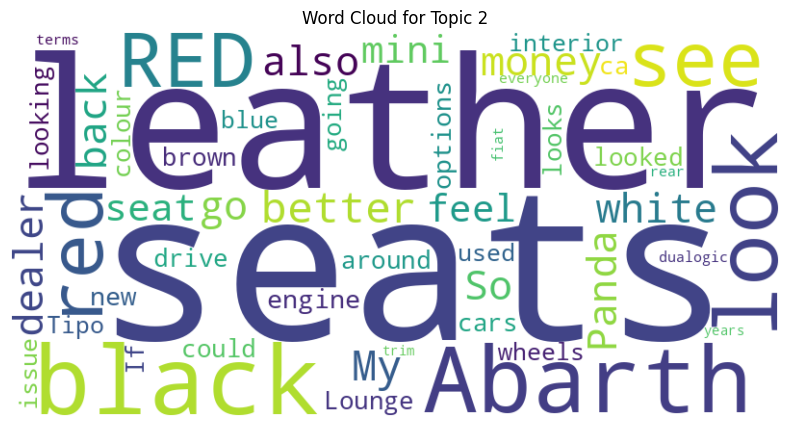

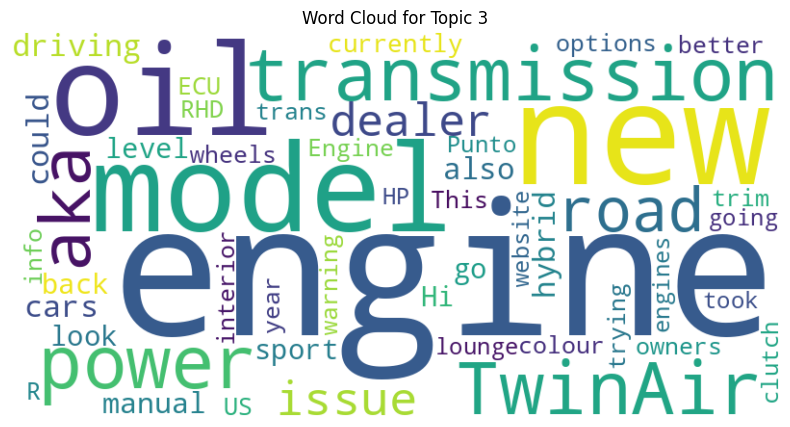

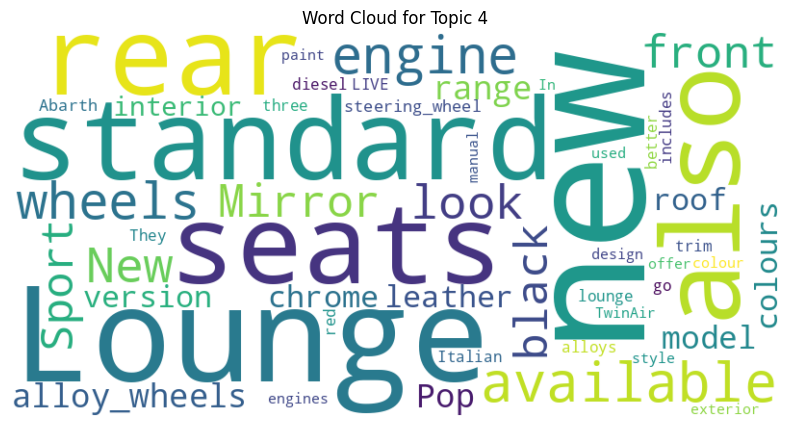

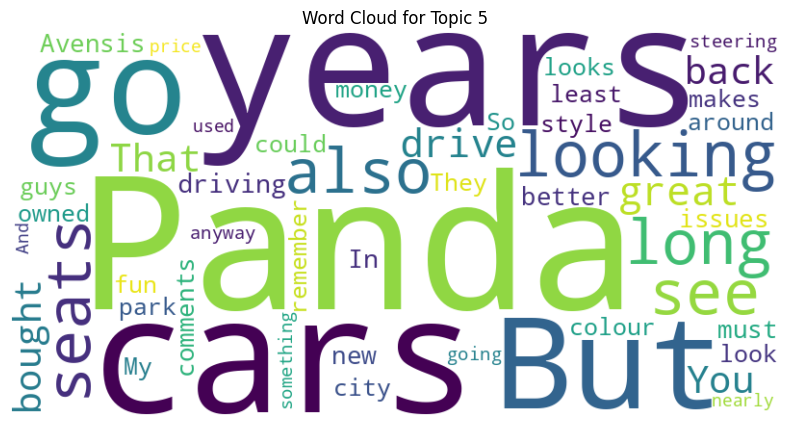

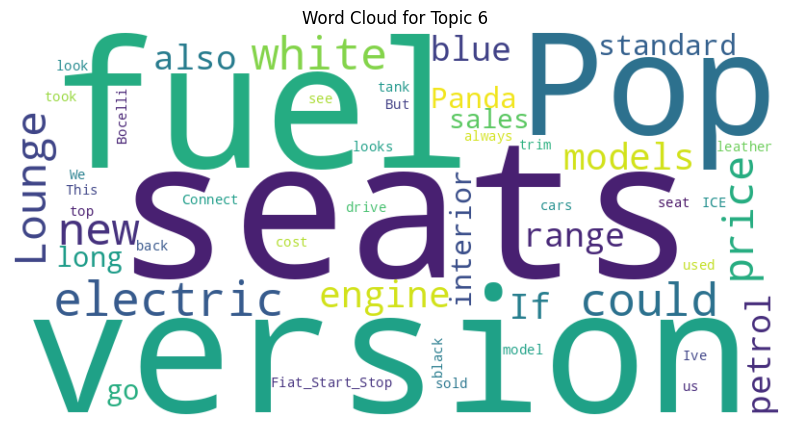

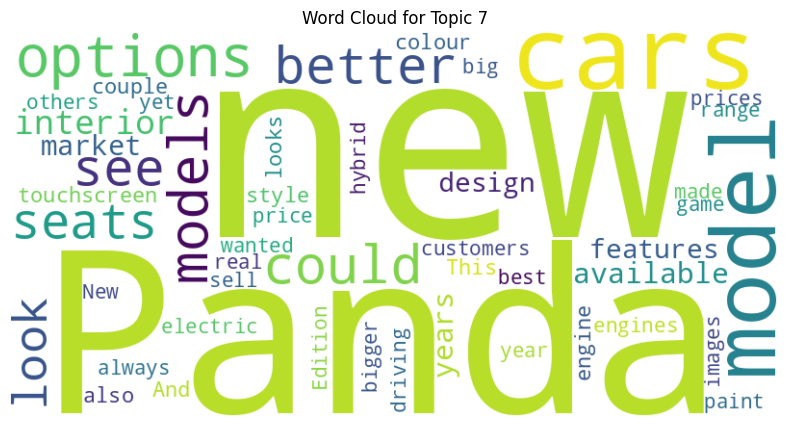

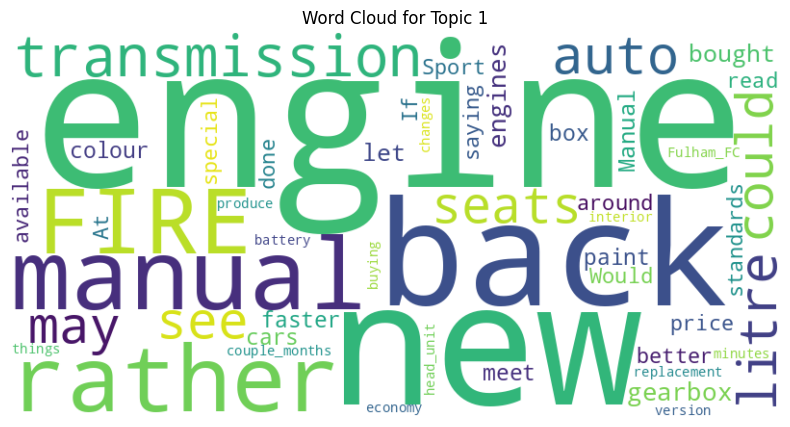

In [27]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Generate word cloud for a specific topic
def plot_word_cloud(optimal_model, topic_id):
    topic = optimal_model.show_topic(topic_id, topn=50)
    topic_words = dict(topic)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(topic_words)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for Topic {topic_id + 1}')
    plt.show()

# Example: Display word clouds for selected topics
plot_word_cloud(optimal_model, 1)
plot_word_cloud(optimal_model, 2)
plot_word_cloud(optimal_model, 3)
plot_word_cloud(optimal_model, 4)
plot_word_cloud(optimal_model, 5)
plot_word_cloud(optimal_model, 6)
plot_word_cloud(optimal_model, 0)



This code calculates and visualizes the average topic distribution across all documents in a corpus. It creates a bar chart showing the average proportion of each topic, which helps in understanding how topics are distributed throughout the documents.

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


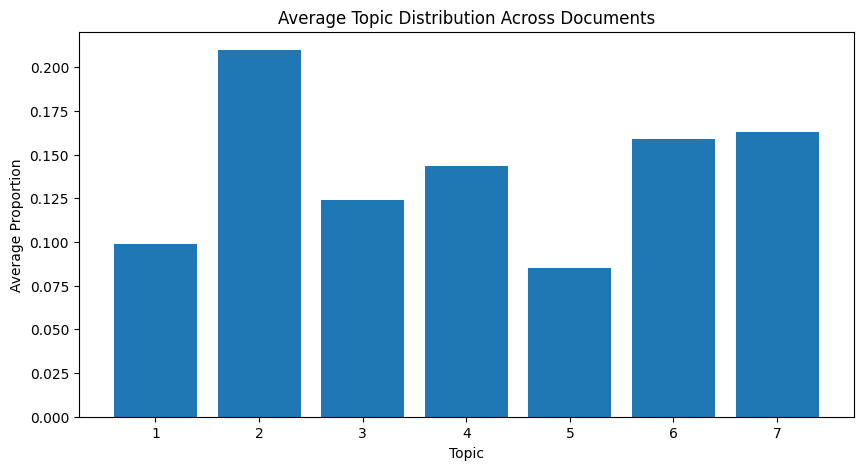

In [28]:
import numpy as np
import matplotlib.pyplot as plt

# Plot topic distribution
def plot_topic_distribution(optimal_model, corpus, num_topics):
    # Initialize the topic distribution matrix
    topic_distribution_matrix = np.zeros((len(corpus), num_topics))

    # Iterate over each document in the corpus
    for i, doc in enumerate(corpus):
        topic_distribution = dict(optimal_model[doc])
        for topic_id, proportion in topic_distribution.items():
            if topic_id < num_topics:  # Ensure the topic ID is within range
                topic_distribution_matrix[i, topic_id] = proportion

    # Calculate the average topic distribution
    avg_topic_distribution = np.mean(topic_distribution_matrix, axis=0)

    # Plot the bar chart
    plt.figure(figsize=(10, 5))
    plt.bar(range(1, num_topics + 1), avg_topic_distribution)  # Set x-axis range starting from 1
    plt.xlabel('Topic')
    plt.ylabel('Average Proportion')
    plt.title('Average Topic Distribution Across Documents')
    plt.show()

# Example: Display the average topic distribution
plot_topic_distribution(optimal_model, corpus, optimal_model.num_topics)


